# Library

In [1]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Auto reload of library
%reload_ext autoreload
%autoreload 2

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)
        
def get_data_from_path(folder_location, folder_name=False, concat_axis='row'):
    # path_folder 하위의 모든 폴더위치와 내부 file 출력
    df = pd.DataFrame()
    print('Getting data from', len(os.listdir(folder_location)), 'folders...')
    for (path, dir, files) in os.walk(folder_location):
#         print(path)
        for file in tqdm(files):
            path_file = os.path.join(path, file)

            ## 데이터 로딩
            if path_file[-4:] == 'xlsx':
                df_sub = pd.read_excel(path_file)
            elif path_file[-3:] == 'csv':
                df_sub = pd.read_csv(path_file)

            ## 키워드 태깅 여부
            if folder_name:
                df_sub['Folder_Name'] = os.path.basename(path)
            
            ## 정리
            if concat_axis == 'col':
                df = pd.concat([df, df_sub], axis=1)
            elif concat_axis == 'row':
                df = pd.concat([df, df_sub], axis=0)
                
    return df

from import_KK import *
DeviceStrategy_CPU()
from preprocessing_KK import *
from preprocessing_text_KK import * ##
from visualization_KK import * ##
from algorithm_textmining_KK import *
from algorithm_machinelearning_KK import *
from algorithm_deeplearning_KK import *
from evaluation_KK import *

# 하이퍼파라미터
DELETE_KEYWORD = ['100세', '거주환경']
CATEGORY_BK = ['경제', '사회', '문화', '국제']
CATEGORY_BK_Sub = ['경제>경제일반', '경제>국제경제', '경제>취업_창업',
                   '사회>노동_복지', '사회>사건_사고', '사회>사회일반', '사회>여성', '사회>장애인', '사회>의료_건강',
                   '문화>미술_건축', '문화>요리_여행', '문화>출판',
                   '국제>중국', '국제>유럽_EU', '국제>일본', '국제>미국_북미', '국제>중동_아프리카',
                   '국제>아시아', '국제>중남미', '국제>국제일반', '국제>러시아']
CATEGORY_CR = ['세계', '경제', '생활/문화', '오피니언', '사회', 'IT/과학']
IMAGE_LOCATION = os.path.join('.', 'Data', 'Image', 'baby-icon_ver1.png')
# IMAGE_LOCATION = os.path.join('.', 'Data', 'Image', 'care.png')
# IMAGE_LOCATION = os.path.join('.', 'Data', 'Image', 'elderly.png')
COLNAME_CATEGORY = '일자'
COLNAME_MINING = '제목'
# SAVE_LOCATION = r'C:\Users\user\Desktop\Data'    # inu
SAVE_LOCATION = r'C:\Users\KK\Desktop\Data'    # home

JAVA is in the system path?:  False
JAVA is in the system path?:  Adding...
Operation Machine:  Intel64 Family 6 Model 186 Stepping 2, GenuineIntel
Operation Platform:  64bit
OS Type:  Windows
OS Version:  10
Python Version:  3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


2024-02-06 01:23:52,936	INFO worker.py:1642 -- Started a local Ray instance.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


2024-02-06 01:24:20,276	INFO worker.py:1476 -- Calling ray.init() again after it has already been called.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Data Loading

## BigKinds

In [2]:
# 필터링한 결과를 최종적으로 사용
df_news = pd.read_csv(os.path.join(SAVE_LOCATION, 'df_news_bigkinds.csv'))
print('Category: ', df_news.Category.value_counts())
keyword_filter = [each for each in df_news['Folder_Name'].unique() if each not in DELETE_KEYWORD]
df_news = df_news[df_news['Folder_Name'].apply(lambda x: x in keyword_filter)].reset_index().iloc[:,1:]
category_filter = [each for each in df_news['통합 분류1'].unique() if each in CATEGORY_BK_Sub]
df_news = df_news[df_news['통합 분류1'].apply(lambda x: x in category_filter)].reset_index().iloc[:,1:]
print('Category: ', df_news.Category.value_counts())

Category:  Category
사회    143555
경제     46072
국제     35535
문화     21051
Name: count, dtype: int64
Category:  Category
사회    143555
경제     46072
국제     35535
문화     21051
Name: count, dtype: int64


In [3]:
# 불러오기
save_name_list=['wordfreq_year_soynlp.csv', 'wordfreq_year_soynlpadj.csv', 
                'wordfreq_year_tfidf.csv', 'wordfreq_year_tfidfadj.csv',
                'wordfreq_year_keybert.csv', 'wordfreq_year_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[0])
wf_year_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[1])
waf_year_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[2])
wf_year_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[3])
waf_year_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[4])
wf_year_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[5])
waf_year_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordfreq_era_soynlp.csv', 'wordfreq_era_soynlpadj.csv', 
                'wordfreq_era_tfidf.csv', 'wordfreq_era_tfidfadj.csv',
                'wordfreq_era_keybert.csv', 'wordfreq_era_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[0])
wf_era_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[1])
waf_era_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[2])
wf_era_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[3])
waf_era_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[4])
wf_era_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[5])
waf_era_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordfreq_senti_soynlp.csv', 'wordfreq_senti_soynlpadj.csv', 
                'wordfreq_senti_tfidf.csv', 'wordfreq_senti_tfidfadj.csv',
                'wordfreq_senti_keybert.csv', 'wordfreq_senti_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[0])
wf_senti_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[1])
waf_senti_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[2])
wf_senti_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[3])
waf_senti_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[4])
wf_senti_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[5])
waf_senti_keybert = pd.read_csv(save_name)
## 중복처리
wf_senti_soynlp = wf_senti_soynlp.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')
waf_senti_soynlp = waf_senti_soynlp.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')
wf_senti_tfidf = wf_senti_tfidf.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')
waf_senti_tfidf = waf_senti_tfidf.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')
wf_senti_keybert = wf_senti_keybert.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')
waf_senti_keybert = waf_senti_keybert.sort_values(by='score', ascending=False).drop_duplicates(['word'], keep='first')

# 불러오기
save_name_list=['wordfreq_age_soynlp.csv', 'wordfreq_age_soynlpadj.csv', 
                'wordfreq_age_tfidf.csv', 'wordfreq_age_tfidfadj.csv',
                'wordfreq_age_keybert.csv', 'wordfreq_age_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[0])
wf_age_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[1])
waf_age_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[2])
wf_age_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[3])
waf_age_tfidf = pd.read_csv(save_name)
# save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[4])
# wf_age_keybert = pd.read_csv(save_name)
# save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[5])
# waf_age_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordfreq_agesenti_soynlp.csv', 'wordfreq_agesenti_soynlpadj.csv', 
                'wordfreq_agesenti_tfidf.csv', 'wordfreq_agesenti_tfidfadj.csv',
                'wordfreq_agesenti_keybert.csv', 'wordfreq_agesenti_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[0])
wf_agesenti_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[1])
waf_agesenti_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[2])
wf_agesenti_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[3])
waf_agesenti_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[4])
wf_agesenti_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordFreq', save_name_list[5])
waf_agesenti_keybert = pd.read_csv(save_name)

In [4]:
# 불러오기
save_name_list=['wordcorr_year_soynlp.csv', 'wordcorr_year_soynlpadj.csv', 
                'wordcorr_year_tfidf.csv', 'wordcorr_year_tfidfadj.csv',
                'wordcorr_year_keybert.csv', 'wordcorr_year_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[0])
wf_yearcorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[1])
waf_yearcorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[2])
wf_yearcorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[3])
waf_yearcorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[4])
wf_yearcorr_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[5])
waf_yearcorr_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordcorr_era_soynlp.csv', 'wordcorr_era_soynlpadj.csv', 
                'wordcorr_era_tfidf.csv', 'wordcorr_era_tfidfadj.csv',
                'wordcorr_era_keybert.csv', 'wordcorr_era_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[0])
wf_eracorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[1])
waf_eracorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[2])
wf_eracorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[3])
waf_eracorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[4])
wf_eracorr_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[5])
waf_eracorr_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordcorr_senti_soynlp.csv', 'wordcorr_senti_soynlpadj.csv', 
                'wordcorr_senti_tfidf.csv', 'wordcorr_senti_tfidfadj.csv',
                'wordcorr_senti_keybert.csv', 'wordcorr_senti_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[0])
wf_senticorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[1])
waf_senticorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[2])
wf_senticorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[3])
waf_senticorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[4])
wf_senticorr_keybert = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[5])
waf_senticorr_keybert = pd.read_csv(save_name)

# 불러오기
save_name_list=['wordcorr_age_soynlp.csv', 'wordcorr_age_soynlpadj.csv', 
                'wordcorr_age_tfidf.csv', 'wordcorr_age_tfidfadj.csv',
                'wordcorr_age_keybert.csv', 'wordcorr_age_keybertadj.csv']
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[0])
wf_agecorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[1])
waf_agecorr_soynlp = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[2])
wf_agecorr_tfidf = pd.read_csv(save_name)
save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[3])
waf_agecorr_tfidf = pd.read_csv(save_name)
# save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[4])
# wf_agecorr_keybert = pd.read_csv(save_name)
# save_name = os.path.join(os.getcwd(), 'Data', 'WordCorr', save_name_list[5])
# waf_agecorr_keybert = pd.read_csv(save_name)

# 구글 검색량 트렌드 예측

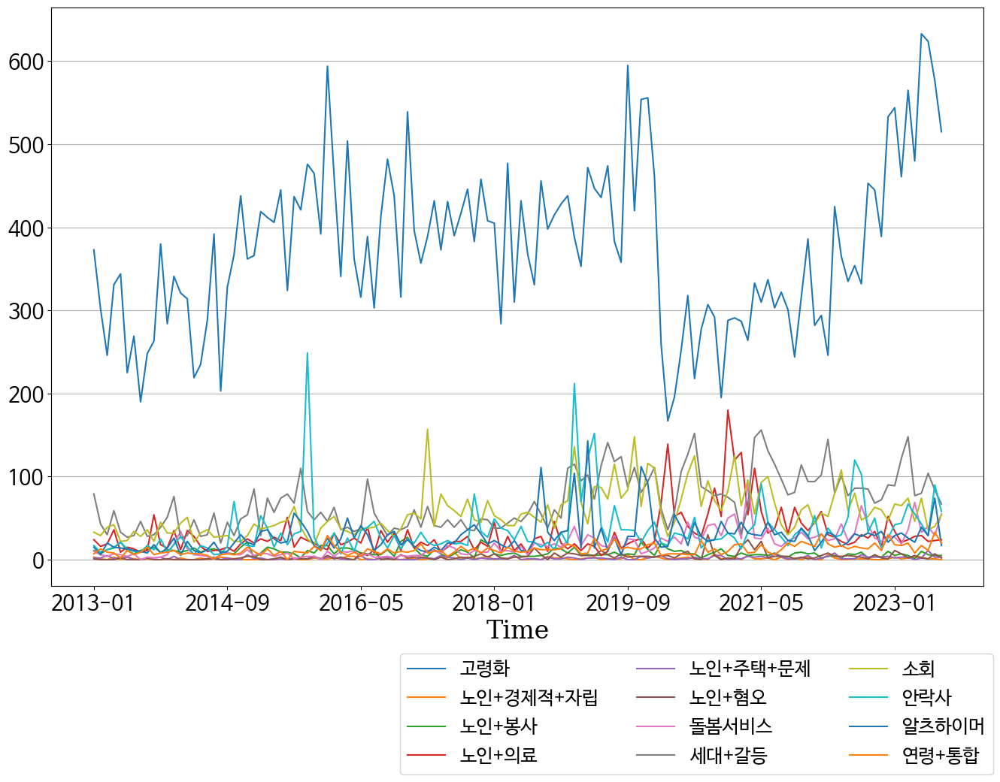

Numerical Scaling... ( 2023-11-05 00:48:48.832123 )


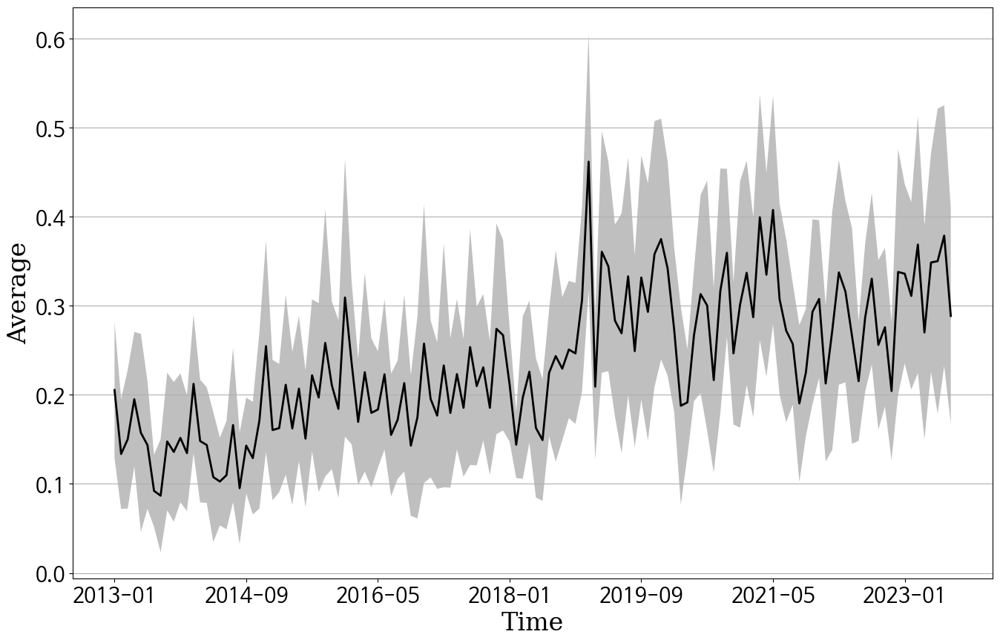

<<< Time Plot Summary >>>


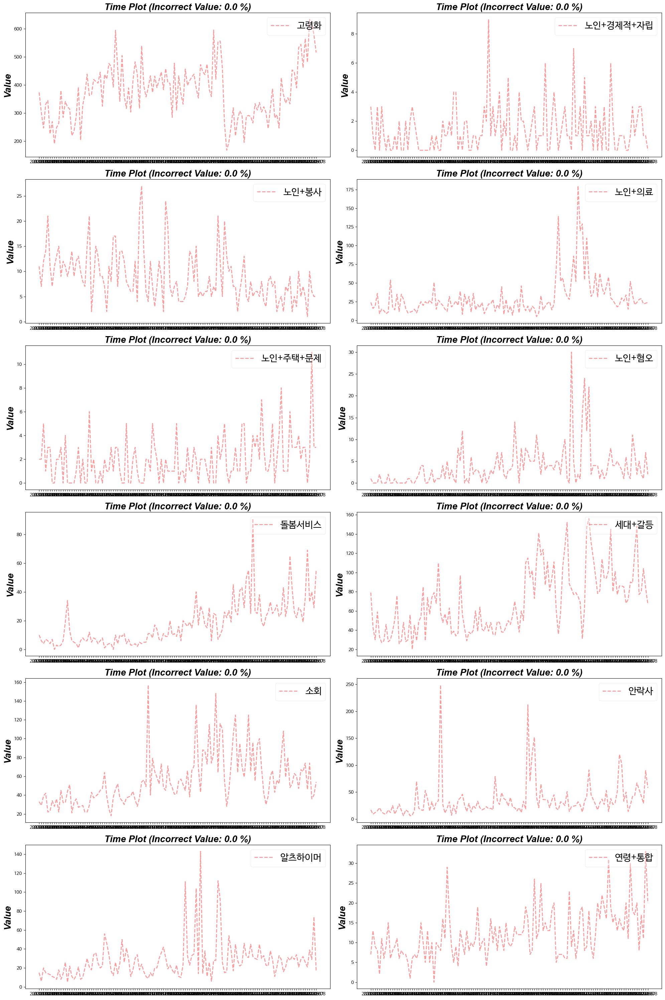

In [20]:
## 증가변수 필터
df_news_rising = df_news.groupby(['Folder_Name', '일자_YearMonth'])['제목'].count().unstack(level=0).fillna(0)
RISING_CATEG = ['고령화', '노인+경제적+자립', '노인+봉사', '노인+의료', 
                '노인+주택+문제', '노인+혐오', '돌봄서비스', '세대+갈등', '소회', 
                '안락사', '알츠하이머', '연령+통합']
df_news_rising = df_news_rising[RISING_CATEG].copy()
## 시각화
plot_timeseries_dforigin(df_news_rising, save_local=True, save_name_initial='gt_total_origin.png')
plot_timeseries_dfmeanstd(df_news_rising, scaled=True, save_local=True, save_name_initial='gt_total_scaled.png')
plot_timeseries(df_news_rising, save_local=True, save_name_initial='gt_each_origin.png')

# 검색어 및 긍부정 트렌드

## 검색어 트랜드: 연도별

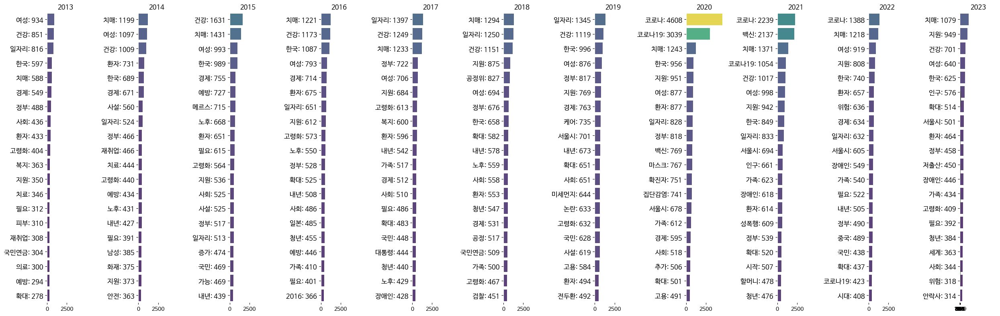

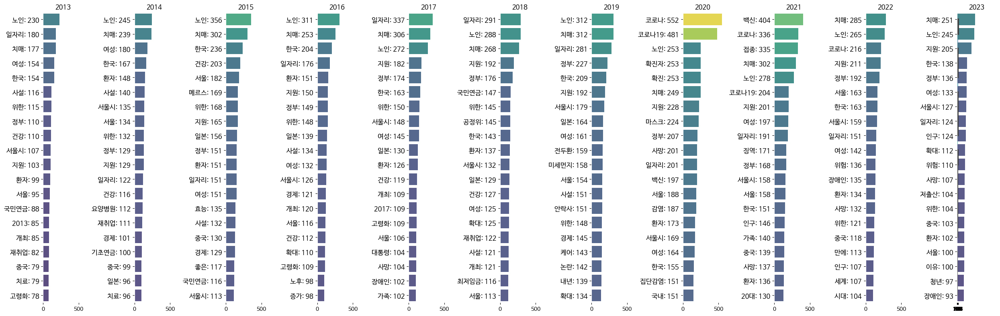

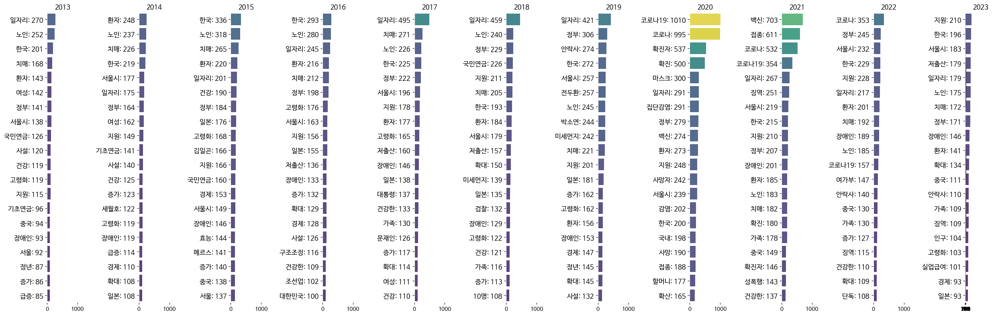

In [19]:
# word freq 비교 트랜드 시각화
plot_bar_wordfreq(wf_year_soynlp.sort_values(by='score', ascending=False).iloc[:1000,:], 
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bysoynlp.png')
plot_bar_wordfreq(wf_year_tfidf.sort_values(by='score', ascending=False).iloc[:1000,:],
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bytfidf.png')
plot_bar_wordfreq(wf_year_keybert.sort_values(by='score', ascending=False).iloc[:1000,:], 
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bykeybert.png')


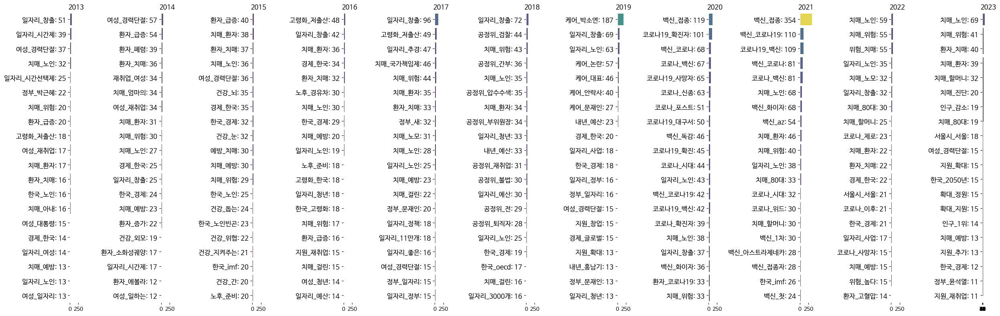

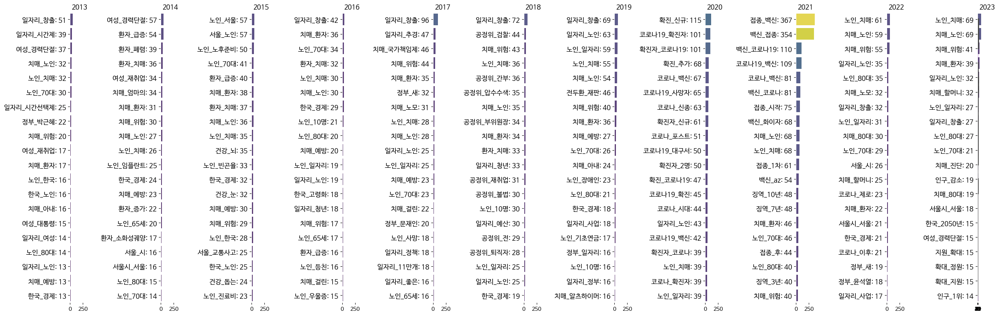

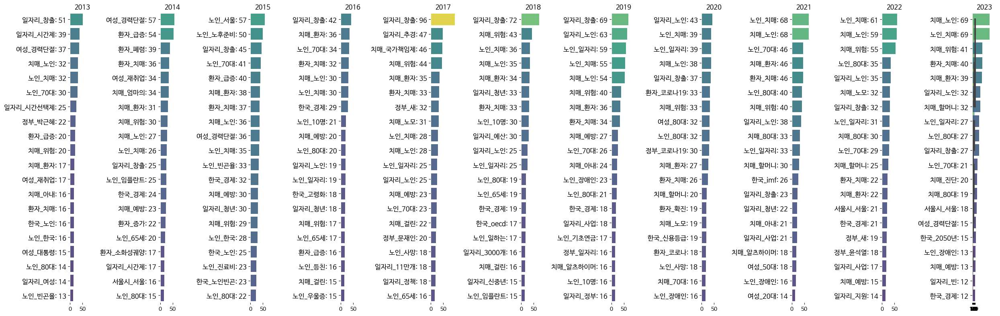

In [20]:
# word freq 비교 트랜드 시각화
plot_bar_wordfreq(waf_year_soynlp.sort_values(by='score', ascending=False).iloc[:1000,:], 
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bysoynlpadj.png')
plot_bar_wordfreq(waf_year_tfidf.sort_values(by='score', ascending=False).iloc[:1000,:],
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bytfidfadj.png')
plot_bar_wordfreq(waf_year_keybert.sort_values(by='score', ascending=False).iloc[:1000,:], 
                  figsize=(25,8), num_showkeyword=20, title='Ageism by Year', save_local=True, save_name='trend_year_bykeybertadj.png')


In [24]:
# # word freq 비교 트랜드 시각화
# plot_sunburst_wordfreq(waf_year_soynlp, title='Ageism by Year', plot_studio=True, save_local=True, save_name='trend_year_bysoynlp.html')
# plot_sunburst_wordfreq(waf_year_tfidf, title='Ageism by Year', plot_studio=True, save_local=True, save_name='trend_year_bytfidf.html')
# plot_sunburst_wordfreq(waf_year_keybert, title='Ageism by Year', plot_studio=True, save_local=True, save_name='trend_year_bykeybert.html')


## 검색어 트랜드: 시대별

2013 ~ 2017


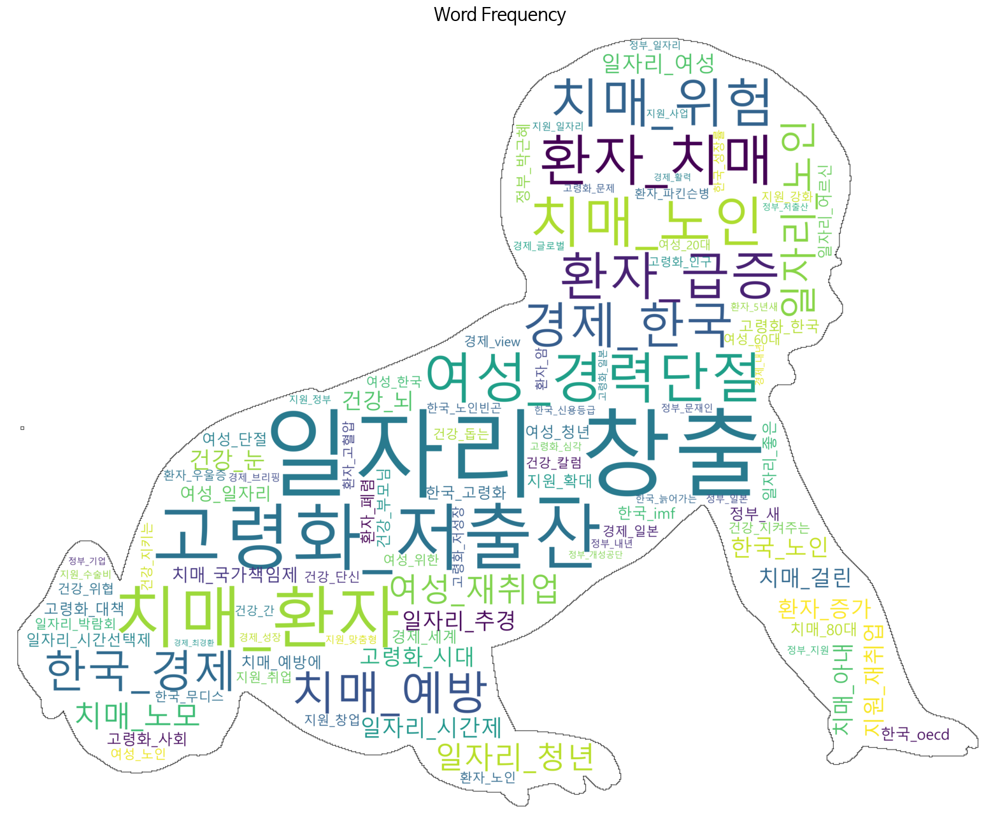

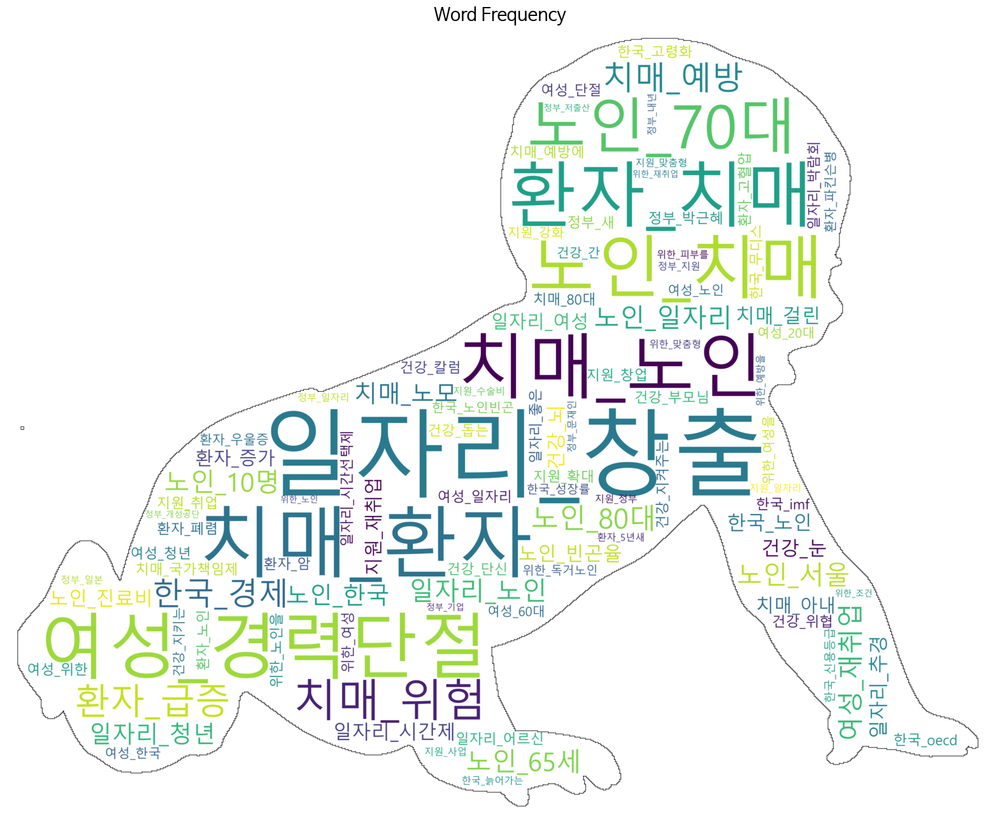

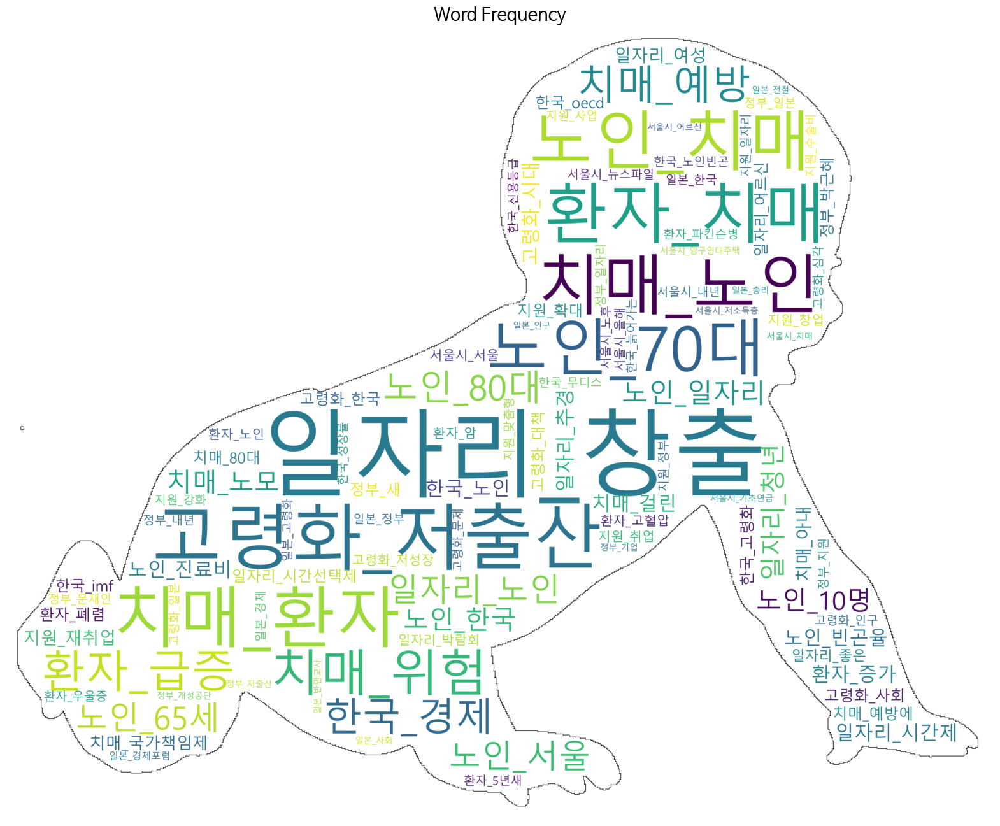

2018 ~ 2023


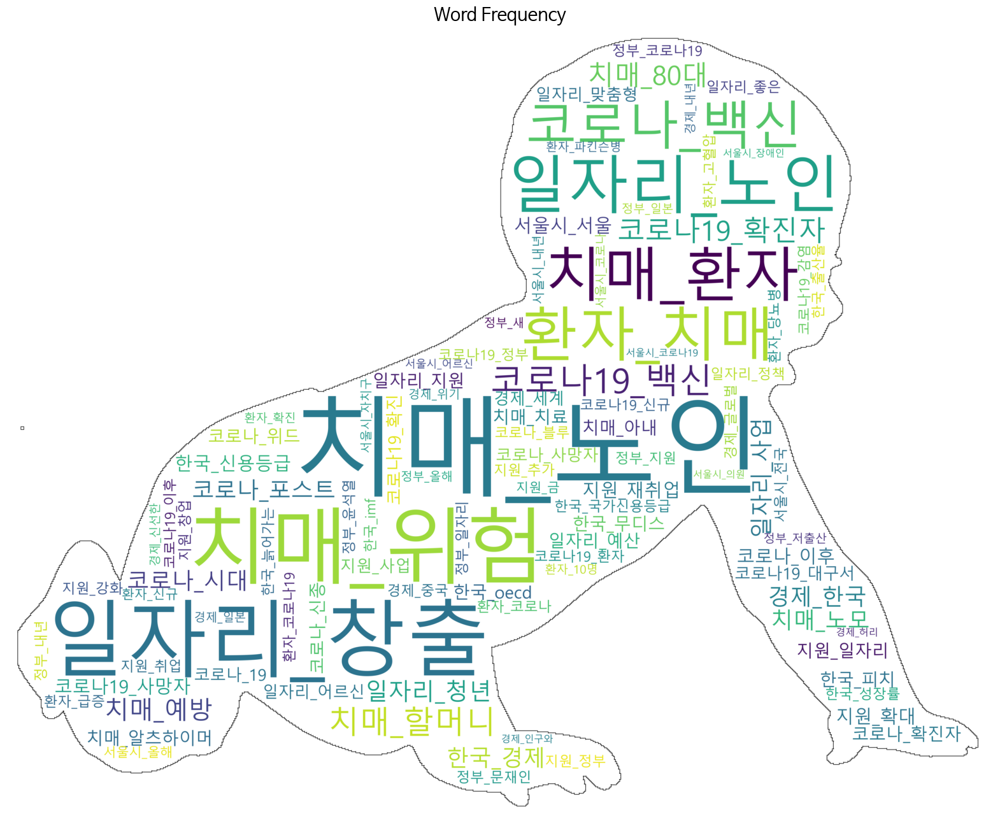

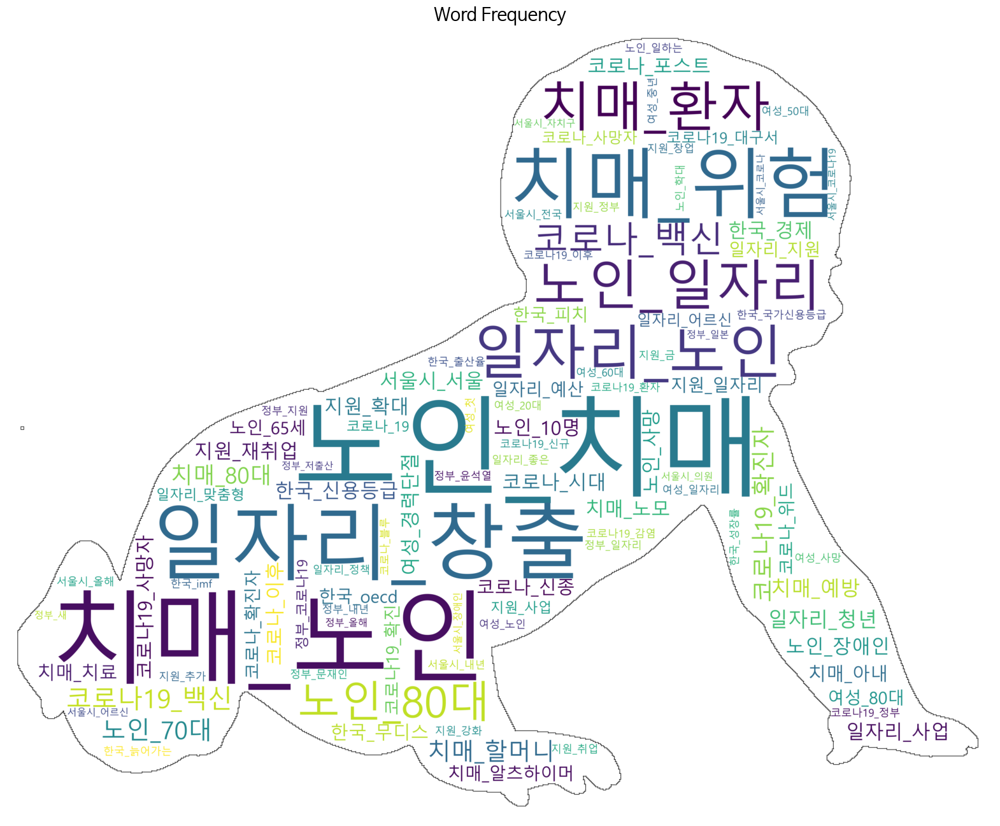

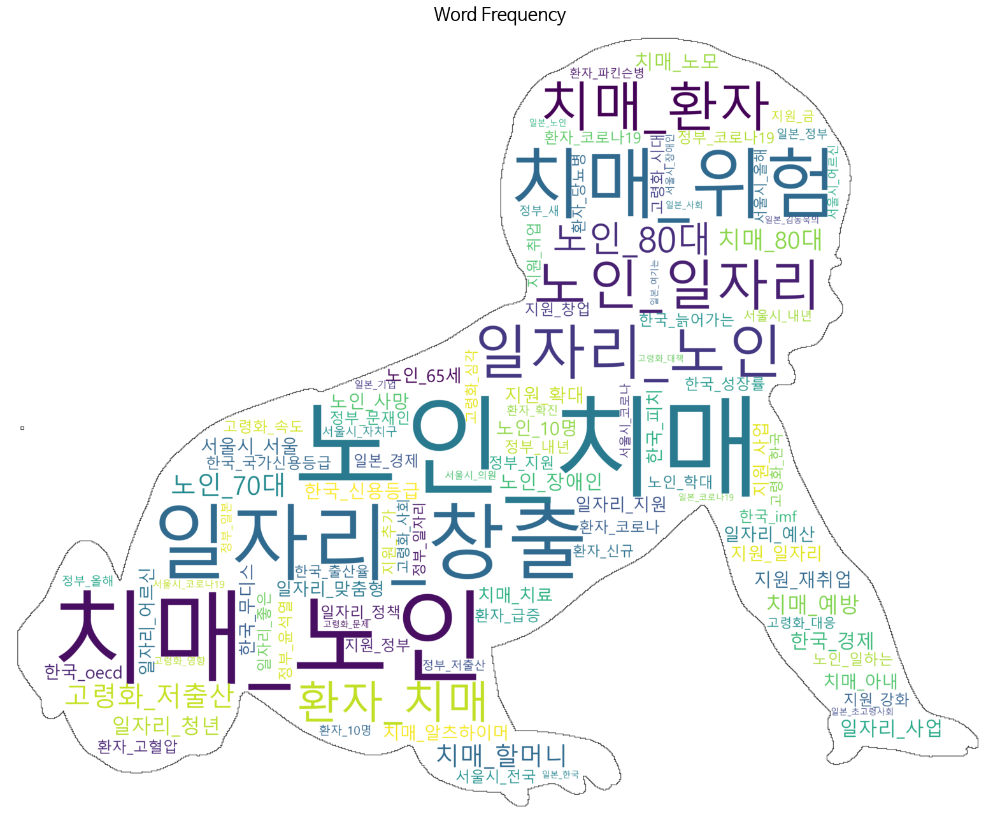

In [25]:
# 연도별 word freq 시각화
centrality_categ = pd.DataFrame()
for category in wf_era_soynlp[wf_era_soynlp.columns[0]].unique():
    print(category)
    waf_sub1 = waf_era_soynlp.groupby(wf_era_soynlp.columns[0]).get_group(category)
    waf_sub2 = waf_era_tfidf.groupby(wf_era_tfidf.columns[0]).get_group(category)
    waf_sub3 = waf_era_keybert.groupby(wf_era_keybert.columns[0]).get_group(category)
    
    plot_wordcloud(waf_sub1.iloc[:,1:], mask_location=IMAGE_LOCATION, mask_colorgen=False, max_words=100,
                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bysoynlpadj.png')
    plot_wordcloud(waf_sub2.iloc[:,1:], mask_location=IMAGE_LOCATION, mask_colorgen=False, max_words=100,
                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bytfidfadj.png')
    plot_wordcloud(waf_sub3.iloc[:,1:], mask_location=IMAGE_LOCATION, mask_colorgen=False, max_words=100,
                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bykeybertadj.png')
    plot_donut_wordfreq(waf_sub1.iloc[:,1:], num_showkeyword=30, 
                        save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bysoynlpadj.html')
    plot_donut_wordfreq(waf_sub2.iloc[:,1:], num_showkeyword=30, 
                        save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bytfidfadj.html')
    plot_donut_wordfreq(waf_sub3.iloc[:,1:], num_showkeyword=30, 
                        save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bykeybertadj.html')


In [11]:
# # word freq 비교 트랜드 시각화
# plot_treemap_wordfreq(waf_era_soynlp, num_showkeyword=100, title='Ageism_Era', plot_studio=True, save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bysoynlpadj.html')
# plot_treemap_wordfreq(waf_era_tfidf, num_showkeyword=100, title='Ageism_Era', plot_studio=True, save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bytfidfadj.html')
# plot_treemap_wordfreq(waf_era_keybert, num_showkeyword=100, title='Ageism_Era', plot_studio=True, save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bykeybertadj.html')

In [21]:
# plot_bar_wordfreq(waf_era_soynlp, figsize=(20,8), num_showkeyword=20, title='Ageism_Era', 
#                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bysoynlpadj.png')
# plot_bar_wordfreq(waf_era_tfidf, figsize=(20,8), num_showkeyword=20, title='Ageism_Era', 
#                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bytfidfadj.png')
# plot_bar_wordfreq(waf_era_keybert, figsize=(20,8), num_showkeyword=20, title='Ageism_Era', 
#                   save_local=True, save_name='trend_era_'+'~'.join(category.split(' ~ '))+'_bykeybertadj.png')


## 긍부정 트렌드: 연도 및 카테고리별

In [8]:
df_plot = df_news.groupby('일자_YearMonth')[['Positive', 'Negative']].sum()
plot_bar(df_plot, summation=True, title='Ageism Sentiment',
         save_local=True, save_name='trend_sentiment_year.html')

df_plot = df_news.groupby(['Category', '일자_YearMonth'])[['Positive', 'Negative']].sum()
for categ in df_plot.index.get_level_values(0).unique():
    idx_sub = [idx for idx in df_plot.index if idx[0] == categ]
    df_sub = df_plot.loc[idx_sub,:].droplevel(0)
    plot_bar(df_sub, summation=True, title=categ,
             save_local=True, save_name='trend_sentiment_year_categ_'+categ+'.html')

In [ ]:
# # 키우드별
# # df_temp = df_news[df_news.Category == '문화']
# df_plot = df_news.groupby(['Folder_Name', '일자_YearMonth'])[['Positive', 'Negative']].sum()
# for categ in df_plot.index.get_level_values(0).unique():
#     idx_sub = [idx for idx in df_plot.index if idx[0] == categ]
#     df_sub = df_plot.loc[idx_sub,:].droplevel(0)
#     plot_bar(df_sub, summation=True, title=categ,
#              save_local=True, save_name='trend_sentiment_year_keyword_'+categ+'.html')

## 긍부정 기사에 따른 키워드 트랜드 차이

In [29]:
# word freq 비교 트랜드 시각화
plot_treemap_wordfreq(waf_senti_soynlp, num_showkeyword=100, title='Ageism by Sentiment', 
                      plot_studio=True, save_local=True, save_name='trend_senti_bysoynlpadj.html')
plot_treemap_wordfreq(waf_senti_tfidf, num_showkeyword=100, title='Ageism by Sentiment', 
                      plot_studio=True, save_local=True, save_name='trend_senti_bytfidfadj.html')
plot_treemap_wordfreq(waf_senti_keybert, num_showkeyword=100, title='Ageism by Sentiment', 
                      plot_studio=True, save_local=True, save_name='trend_senti_bykeybertadj.html')

# plot_sunburst_wordfreq(waf_senti_soynlp, title='Ageism by Sentiment', plot_studio=True, 
#                        save_local=True, save_name='trend_senti_bysoynlpadj.html')
# plot_sunburst_wordfreq(waf_senti_tfidf, title='Ageism by Sentiment', plot_studio=True, 
#                        save_local=True, save_name='trend_senti_bytfidfadj.html')
# plot_sunburst_wordfreq(waf_senti_keybert, title='Ageism by Sentiment', plot_studio=True, 
#                        save_local=True, save_name='trend_senti_bykeybertadj.html')

## 연령대에 따른 긍부정 키워드

In [6]:
for senti in waf_agesenti_tfidf.sentiment.unique():
    waf_sub1 = waf_agesenti_tfidf[waf_agesenti_tfidf.sentiment == senti].iloc[:,:3]
    waf_sub2 = waf_agesenti_keybert[waf_agesenti_keybert.sentiment == senti].iloc[:,:3]
    plot_treemap_wordfreq(waf_sub1, num_showkeyword=100, title=senti+' Ageism by Age', 
                          plot_studio=False, save_local=False, save_name='trend_age_'+senti+'_bytfidfadj.html')
    plot_treemap_wordfreq(waf_sub2, num_showkeyword=100, title=senti+' Ageism by Age', 
                          plot_studio=False, save_local=False, save_name='trend_age_'+senti+'_bykeybertadj.html')

## 연령대에 따른 긍부정 주제

In [18]:
for age in list(range(20, 91, 10)):
    topic_kw, doc_topic, model = modeling_LDA(df_news[(df_news.Age == age) & (df_news.Sentiment == 'Positive')].reset_index().iloc[:,1:]['제목_Origin'], 
                                          opt_numtopics=False, num_topics=3, num_topicwords=10, num_relatedtopic=10,
                                          save_local=True, save_name='Topics_AgePosi'+str(age)+'_byLDA.csv')

# 주제추출 분석

## 카테고리에 따라

In [21]:
SUB_CRITERIA = 'Category'

for categ in tqdm(df_news[SUB_CRITERIA].unique()):
    # 하위데이터 분리
    df_sub = df_news.groupby(SUB_CRITERIA).get_group(categ)[['일자', '제목']].reset_index().iloc[:,1:]
    
    # 주체 추출
    topic_kw, doc_topic, model = modeling_LDA(df_sub['제목'], num_topics=4, num_topicwords=10, num_relatedtopic=10,
                                              save_local=True, save_name='Topics_Categ'+categ+'_byLDA.csv')

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:01<00:00, 15.37s/it]


## 검색키워드에 따라

In [22]:
SUB_CRITERIA = 'Folder_Name'

for categ in tqdm(df_news[SUB_CRITERIA].unique()):
    # 하위데이터 분리
    df_sub = df_news.groupby(SUB_CRITERIA).get_group(categ)[['일자', '제목']].reset_index().iloc[:,1:]
    
    # 주체 추출
    try:
        topic_kw, doc_topic, model = modeling_LDA(df_sub['제목'], num_topics=4, num_topicwords=10, num_relatedtopic=10,
                                                  save_local=True, save_name='Topics_Keyword'+categ+'_byLDA.csv')
    except:
        print(categ)
        pass

 86%|██████████████████████████████████████████████████████████████████████▉           | 32/37 [01:02<00:07,  1.57s/it]WARNING:gensim.models.ldamodel:too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [01:13<00:00,  1.97s/it]


# Testing

In [ ]:
dict_news = df_news.groupby('일자_Year')['제목'].apply(list).to_dict()

ray.init(num_cpus=len(dict_news.keys()), ignore_reinit_error=True, log_to_driver=False)
task = [preprocessing_keybertParallel.remote(pd.Series(dict_news[key]), doc_topn_kwd=5) 
        for key in dict_news.keys()]
result = ray.get(task)
ray.shutdown()

In [ ]:
# https://teddylee777.github.io/huggingface/bert-kor-text-classification/

In [ ]:
from transformers import pipeline, AutoTokenizer, BertTokenizer, BertTokenizerFast
from transformers import AutoModel, AutoModelForTokenClassification, TFBertModel, TFBertForSequenceClassification

TASK = 'text-classification'
MODEL_NAME = 'monologg/kobert' # 'bert-base-multilingual-cased'
SENTENCES = df_news['제목'].to_list()[:2]
SEQ_LEN = 32

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
tokenizer(SENTENCES, max_length=SEQ_LEN, 
          padding='max_length', truncation=True, return_tensors='pt')

# model_sa = pipeline(task=TASK, model=MODEL_NAME)
# result = model_sa(df_news['제목'].to_list()[:100])
# for i, j in zip(df_news['제목'].to_list()[:100], result):
#     print(i,j)

In [ ]:
MODEL_NAME = 'bert-base-multilingual-cased'
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)

X_train = preprocessing_sentence_to_BERTinput(df_news['제목'][:100], tokenizer=tokenizer)

def modeling_BERTsentiment(model_name, optimizer, seq_len=128):
    # 입력 변환
    tokens = tf.keras.layers.Input((seq_len,), dtype=tf.int32, name='input_ids')
    masks = tf.keras.layers.Input((seq_len,), dtype=tf.int32, name='input_masks')
    segments = tf.keras.layers.Input((seq_len,), dtype=tf.int32, name='input_segments')
    
    # 모델 로딩
    model = TFBertModel.from_pretrained(model_name)
    outputs = model([tokens, masks, segments])[1]
    
    # 모델 구성
    layer = tf.keras.layers.Dense(1, activation='sigmoid', 
                                  kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.02))(outputs)
    model_sentiment = tf.keras.Model([tokens, masks, segments], layer)
    model_sentiment.compile(optimizer=optimizer, loss=tf.keras.losses.BinaryCrossentropy(), metrics = ['accuracy'])
    
    return model_sentiment

In [ ]:
# https://towardsdatascience.com/chord-diagrams-of-protein-interaction-networks-in-python-9589affc8b91
    
import nxviz as nv
from nxviz import annotate, highlights
from nxviz.plots import despine, rescale, respine

def plot_nxviz(df_freq, df_pairweight, filter_criteria=None):
    pass

G, centrality_total = plot_networkx(FREQ_USING, df_word_corrpair, filter_criteria=None, plot=False)
ax = nv.circos(G, group_by="group_node", node_color_by="group_node")
annotate.circos_labels(G, group_by="group_node", radius=np.pi)
annotate.node_colormapping(G, color_by='group_node')
# annotate.node_labels(G, group_by="group_node", sort_by='score')
annotate.circos_group(G, group_by="group_node")